In [2]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [3]:
%cd /content/gdrive/MyDrive


/content/gdrive/MyDrive


In [2]:
%pip install ultralytics

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.93 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.8/107.7 GB disk)


In [30]:
!unzip CastProduct.v1i.folder.zip -d ./data

Görüntülenen çıkış son 5000 satıra kısaltıldı.
 extracting: ./data/train/def_front/cast_def_0_5836_jpeg.rf.c9e4a3c40dec1bb8b3e6ae35dc289348.jpg  
 extracting: ./data/train/def_front/cast_def_0_5838_jpeg.rf.e8514e933db7bf9935558f92e5fa691f.jpg  
 extracting: ./data/train/def_front/cast_def_0_5848_jpeg.rf.2a1082db69a2db6dbdefb95487d187d3.jpg  
 extracting: ./data/train/def_front/cast_def_0_5850_jpeg.rf.94621d69b423a1e0a459407a933ef027.jpg  
 extracting: ./data/train/def_front/cast_def_0_5857_jpeg.rf.65a34c93fb6a71f4c1423e9b432453e3.jpg  
 extracting: ./data/train/def_front/cast_def_0_5858_jpeg.rf.384d7ecdd233107c3f88850f3cf61296.jpg  
 extracting: ./data/train/def_front/cast_def_0_5859_jpeg.rf.958be3521bce2f8ef6e871bd38c17a5b.jpg  
 extracting: ./data/train/def_front/cast_def_0_5861_jpeg.rf.f231e528a2669ed6a9b73ff160d4b20e.jpg  
 extracting: ./data/train/def_front/cast_def_0_5864_jpeg.rf.83f6d4d1145442160bb829ca503b3c08.jpg  
 extracting: ./data/train/def_front/cast_def_0_5865_jpeg.rf.2e

In [32]:
!yolo task=classify mode=train model=yolov8m-cls.pt data='data' epochs=50 imgsz=64

New https://pypi.org/project/ultralytics/8.2.93 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=classify, mode=train, model=yolov8m-cls.pt, data=data, epochs=50, time=None, patience=100, batch=16, imgsz=64, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save

In [12]:
!yolo task=classify mode=predict model=runs/classify/train2/weights/best.pt source='data/test/def_front' imgsz=64


Ultralytics YOLOv8.2.93 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8m-cls summary (fused): 103 layers, 15,765,218 parameters, 0 gradients, 41.6 GFLOPs

image 1/436 /content/gdrive/MyDrive/data/test/def_front/cast_def_0_1007_jpeg.rf.5d249848d95dd2494b48d3d01a57d1a3.jpg: 64x64 def_front 1.00, ok_front 0.00, 24.1ms
image 2/436 /content/gdrive/MyDrive/data/test/def_front/cast_def_0_1008_jpeg.rf.620e8e6302ce80d2f3e9e9ddb5a81112.jpg: 64x64 def_front 1.00, ok_front 0.00, 21.1ms
image 3/436 /content/gdrive/MyDrive/data/test/def_front/cast_def_0_1048_jpeg.rf.b0c9e7689b95c90708e91ade40817b8c.jpg: 64x64 def_front 1.00, ok_front 0.00, 20.7ms
image 4/436 /content/gdrive/MyDrive/data/test/def_front/cast_def_0_1066_jpeg.rf.1502fc57d12404d96c8dea7ace76ec2c.jpg: 64x64 def_front 1.00, ok_front 0.00, 25.9ms
image 5/436 /content/gdrive/MyDrive/data/test/def_front/cast_def_0_1092_jpeg.rf.198113e5446488184b5604cdfef0d0bf.jpg: 64x64 def_front 1.00, ok_front 0.00, 21.2ms
image 6/436 /con

In [8]:
import matplotlib.pyplot as plt
import cv2
import os
from ultralytics import YOLO

# Model ve tahmin yapılan veriler
model_path = 'runs/classify/train2/weights/best.pt'  # Eğitilmiş modelin yolu
test_dir = 'data/test/def_front'  # Test verisi yolu

# Modeli yükle
model = YOLO(model_path)

# Tahminleri al
results = model.predict(source=test_dir, imgsz=64, save=True)

# Tahmin edilen görsellerin kaydedildiği dizin
predicted_dir = 'runs/classify/predict5/'  # Tahmin çıktılarının kaydedildiği klasör
img_files = [f for f in os.listdir(predicted_dir) if f.endswith('.jpg') or f.endswith('.png')]

# Tahmin edilen her görseli sırayla göster
for i, img_file in enumerate(img_files):
    img_path = os.path.join(predicted_dir, img_file)

    # Görseli yükle
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV BGR formatında açar, RGB'ye dönüştür

    # Tahmin edilen sınıfı al
    predicted_class = results[i].names[results[i].probs.top1]  # En yüksek olasılıklı sınıf adı

    # Görsel üzerine tahmin edilen sınıfı ekleyelim
    cv2.putText(img, predicted_class, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

    # Görseli çiz
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')  # Eksenleri gizle
    plt.show()


image 1/292 /content/gdrive/MyDrive/data/test/ok_front/cast_ok_0_1019_jpeg.rf.e9cbba783a45bd2d004fabe6f396e916.jpg: 64x64 ok_front 1.00, def_front 0.00, 22.0ms
image 2/292 /content/gdrive/MyDrive/data/test/ok_front/cast_ok_0_1077_jpeg.rf.804ceb7c983f159c1fac44cb97c35896.jpg: 64x64 ok_front 1.00, def_front 0.00, 21.8ms
image 3/292 /content/gdrive/MyDrive/data/test/ok_front/cast_ok_0_1119_jpeg.rf.559107f345743b34757cf19bde3b2b1c.jpg: 64x64 ok_front 1.00, def_front 0.00, 63.7ms
image 4/292 /content/gdrive/MyDrive/data/test/ok_front/cast_ok_0_1148_jpeg.rf.6606575864d160133e1e3be6e25f0834.jpg: 64x64 ok_front 1.00, def_front 0.00, 25.9ms
image 5/292 /content/gdrive/MyDrive/data/test/ok_front/cast_ok_0_114_jpeg.rf.dd5976772d640bd39fc32f9bd1715cd2.jpg: 64x64 ok_front 1.00, def_front 0.00, 31.0ms
image 6/292 /content/gdrive/MyDrive/data/test/ok_front/cast_ok_0_1173_jpeg.rf.e66a5765683c058a20be198f143cb149.jpg: 64x64 ok_front 1.00, def_front 0.00, 27.4ms
image 7/292 /content/gdrive/MyDrive/data

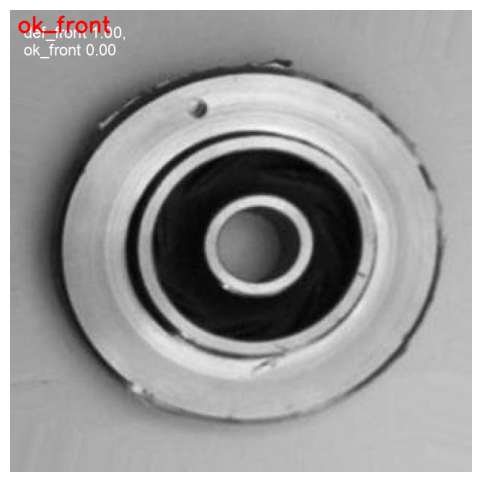

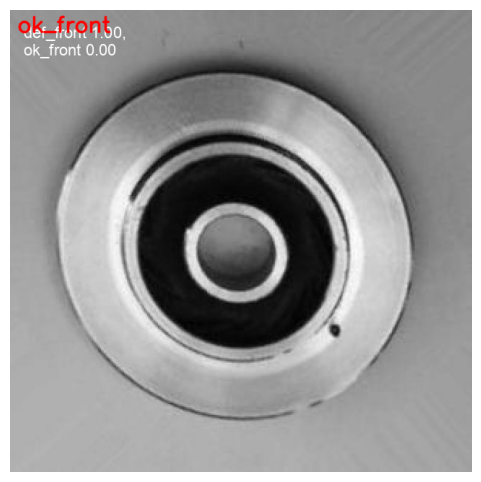

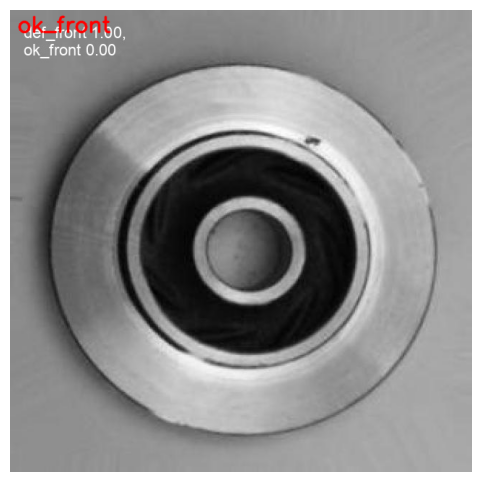

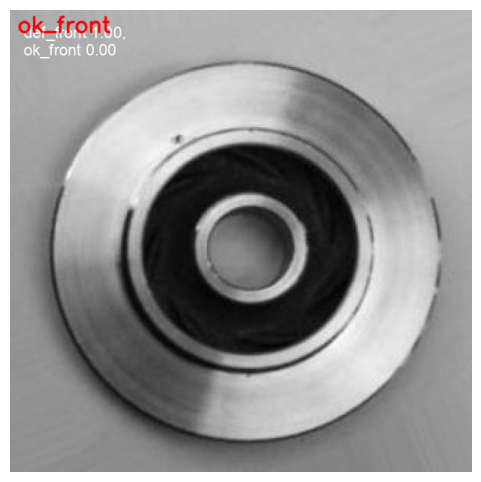

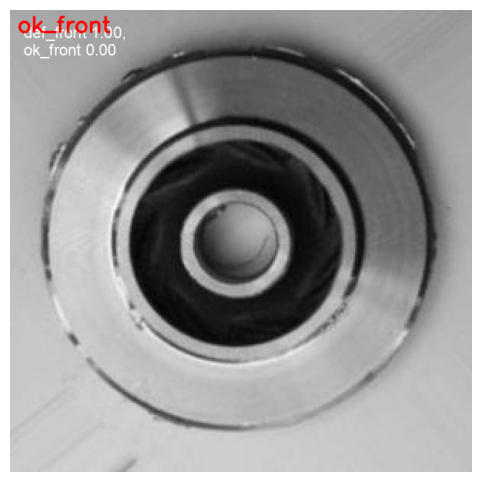

...

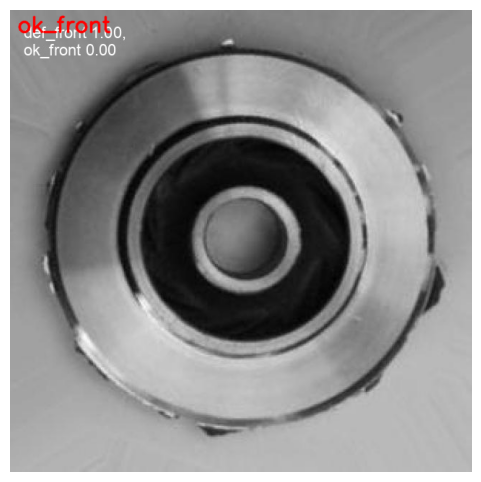

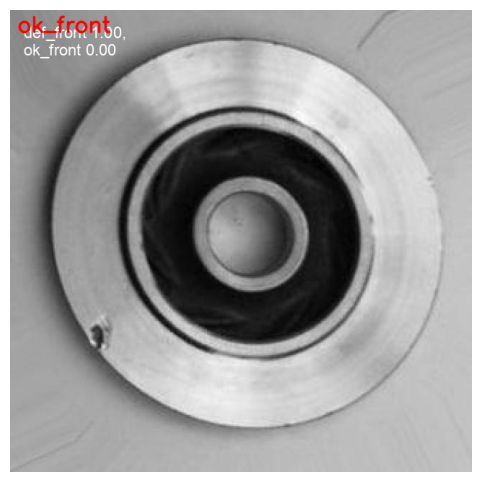

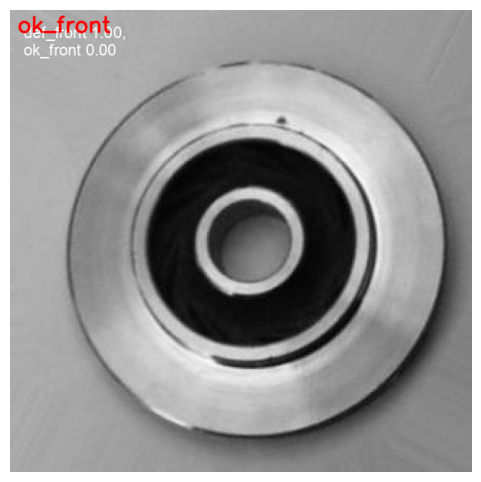

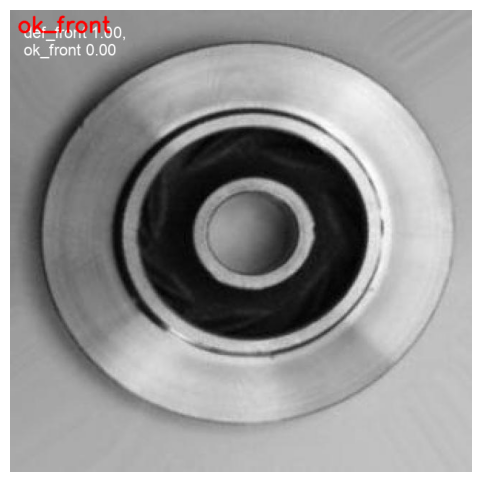

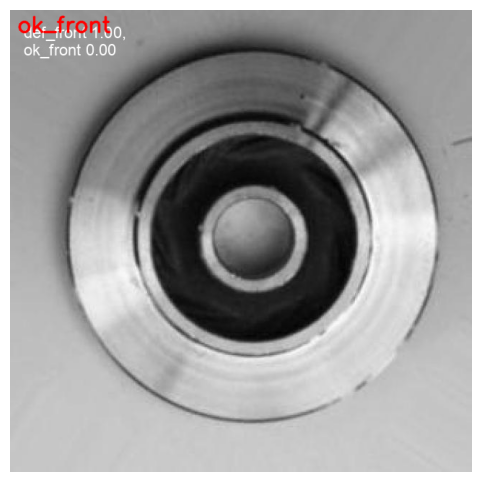

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
from ultralytics import YOLO

# Model ve tahmin yapılan veriler
model_path = 'runs/classify/train2/weights/best.pt'  # Eğitilmiş modelin yolu
test_dir = 'data/test/ok_front'  # Test verisi yolu

# Modeli yükle
model = YOLO(model_path)

# Tahminleri al
results = model.predict(source=test_dir, imgsz=64, save=True)

# Tahmin edilen görsellerin kaydedildiği dizin
predicted_dir = 'runs/classify/predict5/'  # Tahmin çıktılarının kaydedildiği klasör
img_files = [f for f in os.listdir(predicted_dir) if f.endswith('.jpg') or f.endswith('.png')]

# Tahmin edilen her görseli sırayla göster
for i, img_file in enumerate(img_files):
    img_path = os.path.join(predicted_dir, img_file)

    # Görseli yükle
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV BGR formatında açar, RGB'ye dönüştür

    # Tahmin edilen sınıfı al
    predicted_class = results[i].names[results[i].probs.top1]  # En yüksek olasılıklı sınıf adı

    # Görsel üzerine tahmin edilen sınıfı ekleyelim
    cv2.putText(img, predicted_class, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

    # Görseli çiz
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')  # Eksenleri gizle
    plt.show()